# Introduction

This is the analysis of gut intestinal stem cell data as presented in Böttcher et al. We use in total **75,012** cells from **14 samples** in **6 conditions** (2 replicates in each mutant, 3 replicates in each control and 1 sample FVR only controls):

* Control (whole crypt)
* Control (FVR enriched)
* Control (FVR only)
* Mutant (Fltp deficient, whole crypt)
* Mutant (Fltp deficient, FVR enriched)
* Control (High fat diet project)

In this notebook, data are batch corrected and normalised.

We filtered cells by

* number of reads
* number of detected genes
* fraction of mitochondrial reads (< 10%) 


## Tasks in this notebook

In order to keep the notebook structure short and well-arranged, we have split the gut intestinal stem cell analysis into several parts:

1. Pre-processing and filtering
2. Preparation of Batch effect correction
3. Batch effect correction with adjusted Combat
4. Cell type annotation (control only) 
    * ISC subtype annotation
    * Goblet, Paneth, Tuft cell subtype annotation
    * EEC subtype annotation
5. Data analysis with Graph abstraction (control only)
6. Pseudotime analysis of ISC-PC-EEC-Goblet lineage

This notebook covers **part 4** with ISC subtype annotation.

# Initialise scanpy

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
import matplotlib.colors as colors
import scanpy.api as sc
import matplotlib as mpl
import anndata
#import matplotlib.pyplot as plt
from matplotlib import rcParams

import scipy as sci
import os

sc.settings.verbosity = 3                # amount of output
sc.settings.set_figure_params(dpi=60, color_map='RdYlBu_r')
sc.logging.print_version_and_date()

Running Scanpy 1.3.1 on 2021-02-07 20:28.


In [2]:
sc.settings.figdir ='./../figures/'

## Load scanpy extensions

In [3]:
%run '~/Documents/Python/maren_codes/bar_frequency.py'
%run '~/Documents/Python/maren_codes/cal_density.py'
%run '~/Documents/Python/maren_codes/genes_to_xls.py'

## Add custom color map

In [4]:
colors2 = pl.cm.RdGy_r(np.linspace(0.4, 1, 128))
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colors2)

## Add date

In [5]:
import datetime

now = datetime.datetime.now()
today = now.strftime("%y%m%d")

# Load data

In [6]:
adata = sc.read('./../data/gut_AB_AL_log_cor_combat_normed.h5')

In [7]:
adata

AnnData object with n_obs × n_vars = 72290 × 2000 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'S_score', 'G2M_score', 'phase'
    var: 'mean', 'dispersion'
    uns: 'neighbors', 'pca', 'sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [8]:
pd.crosstab(adata.obs['sample'], adata.obs['genetics'])

genetics,control,mutant
sample,,
CD_1,5216,0
CD_2,5232,0
CD_3,4988,0
Control_1,3828,0
Control_2,3136,0
Control_3_FVR,4391,0
Control_4_FVR,5075,0
Control_5_FVR,8856,0
Control_6,7059,0


# Annotate cell cycle

In [9]:
cc_gene_list= [x.strip() for x in open('./../data/regev_lab_cell_cycle_genes.txt')]

The gene list was derived from a human cell line, so we have to put the names in lower case.

In [10]:
cc_gene_list_cap = [gene.capitalize() for gene in cc_gene_list]

Check which cell cycle genes can be found in the `var_names`.

In [11]:
gene_exist = np.in1d(cc_gene_list_cap, adata.var_names)

Split the list by cell cycle stage.

In [12]:
c = [cc_gene_list_cap[i] for i in np.flatnonzero(gene_exist[:43])]
g2m = [cc_gene_list_cap[i] for i in np.flatnonzero(gene_exist[43:])]

In [13]:
sc.tl.score_genes_cell_cycle(adata=adata, g2m_genes=g2m,s_genes=c)

calculating cell cycle phase
computing score 'S_score'
    finished (0:00:13.46) --> added
    'S_score', score of gene set (adata.obs)
computing score 'G2M_score'
    finished (0:00:19.02) --> added
    'G2M_score', score of gene set (adata.obs)
-->     'phase', cell cycle phase (adata.obs)


Save cell cycle scored data to file.

In [17]:
sc.write(adata=adata, filename='./../data/gut_AB_AL_log_cor_combat_normed.h5')

# Reduce data to control samples

For the subsequent analysis, we exclude the mutant sample data.

In [14]:
adata_ctrl = adata[adata.obs['genetics']=='control']

In [15]:
adata_ctrl

View of AnnData object with n_obs × n_vars = 56292 × 2000 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'S_score', 'G2M_score', 'phase'
    var: 'mean', 'dispersion'
    uns: 'neighbors', 'pca', 'sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

# Dimension reduction

We computed a possible clustering based on all genes. However, we re-compute the cluster annotation based on highly variable genes.

In [16]:
sc.tl.pca(adata_ctrl, svd_solver='arpack')

In [21]:
sc.tl.tsne(adata_ctrl)

computing tSNE
    using 'X_pca' with n_pcs = 50
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished (0:10:41.99) --> added
    'X_tsne', tSNE coordinates (adata.obsm)


In [17]:
sc.pp.neighbors(adata_ctrl, n_neighbors=30)
sc.tl.umap(adata_ctrl)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:44.76) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:01:20.53) --> added
    'X_umap', UMAP coordinates (adata.obsm)


Plot louvain groups and cell cycle scoring (if they are available again).

... storing 'phase' as categorical


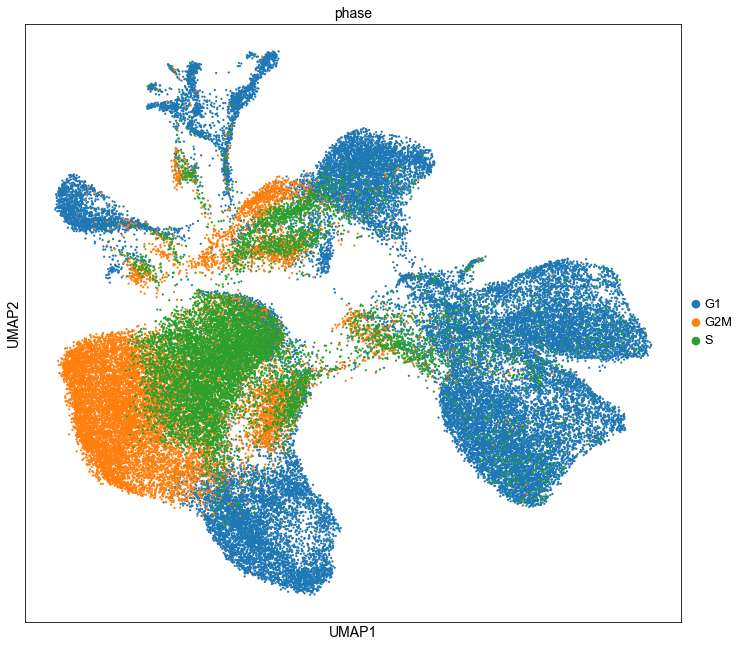

In [18]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata_ctrl, color=['phase'], size=20)

## Gene expression plots

We use the gene expression plot as first visual test to annotate clusters by cell type.

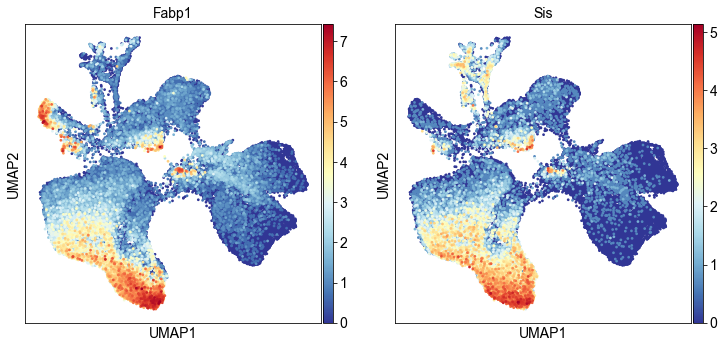

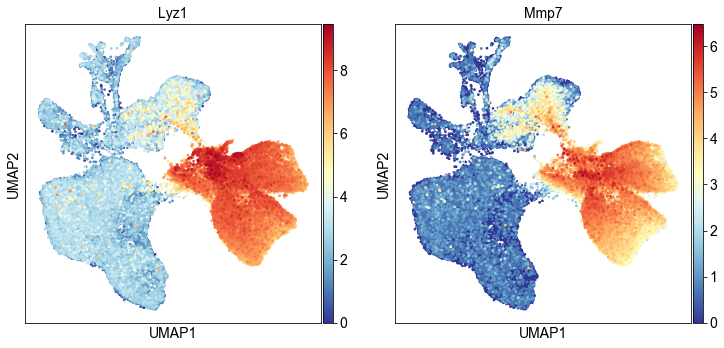

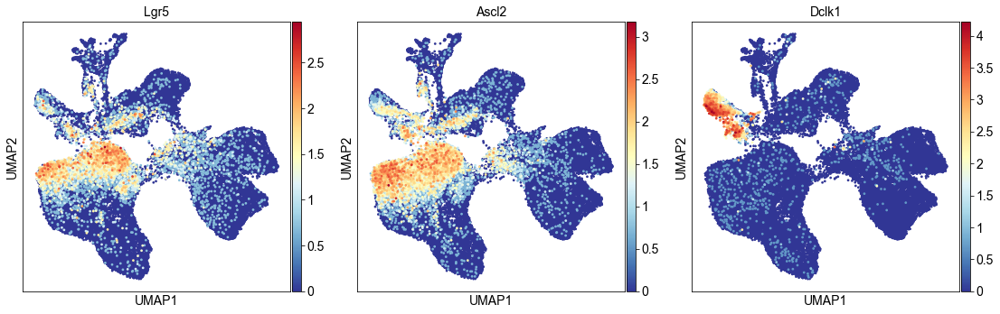

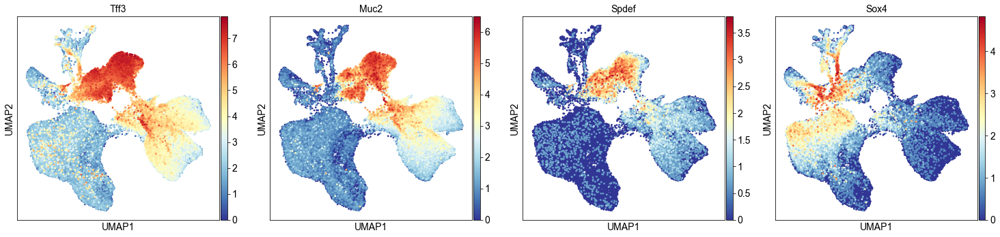

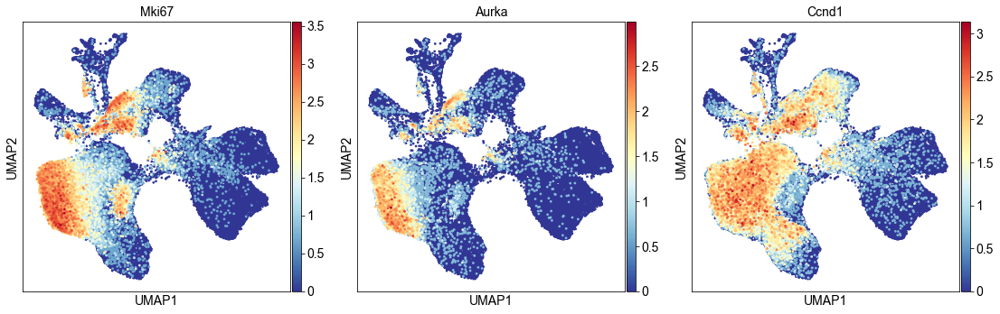

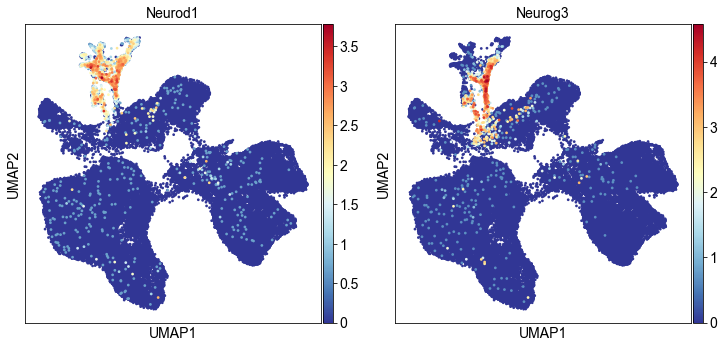

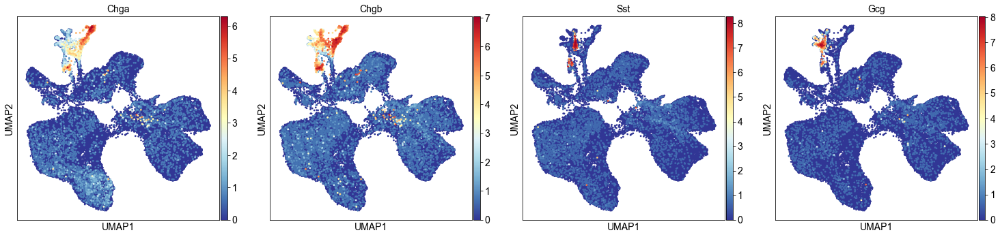

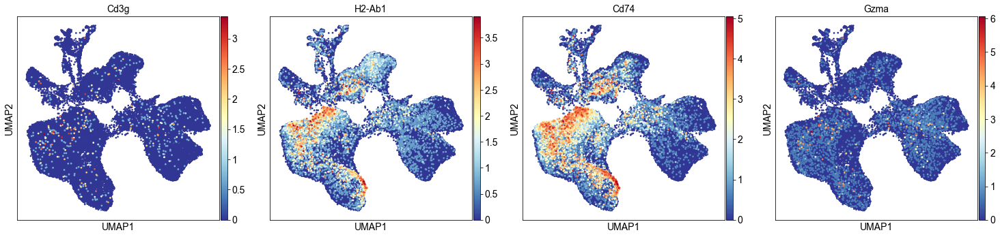

In [19]:
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata_ctrl, color=['Fabp1', 'Sis'], size=30)
sc.pl.umap(adata_ctrl, color=['Lyz1', 'Mmp7'], size=30)
sc.pl.umap(adata_ctrl, color=['Lgr5', 'Ascl2', 'Dclk1'], size=30)
sc.pl.umap(adata_ctrl, color=['Tff3', 'Muc2', 'Spdef', 'Sox4'], size=30)
sc.pl.umap(adata_ctrl, color=['Mki67', 'Aurka', 'Ccnd1'], size=30)
sc.pl.umap(adata_ctrl, color=['Neurod1', 'Neurog3'], size=30)
sc.pl.umap(adata_ctrl, color=[ 'Chga', 'Chgb', 'Sst', 'Gcg'], size=30)
sc.pl.umap(adata_ctrl, color=['Cd3g', 'H2-Ab1', 'Cd74', 'Gzma'], size=30)

# Clustering and annotation 

Let us compute a clustering and check on the identity of each cluster by differential gene expression tests.

In [20]:
sc.tl.louvain(adata_ctrl, resolution=1)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:06.94) --> found 14 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


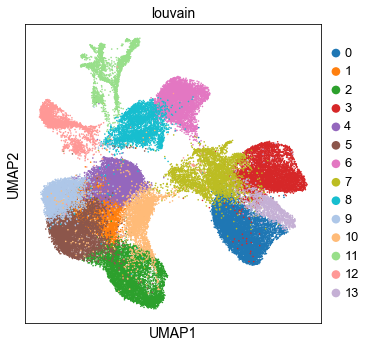

In [21]:
sc.pl.umap(adata_ctrl, color='louvain', size=10)

In [22]:
sc.tl.rank_genes_groups(adata_ctrl, groupby='louvain')

ranking genes
    finished (0:01:40.21) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


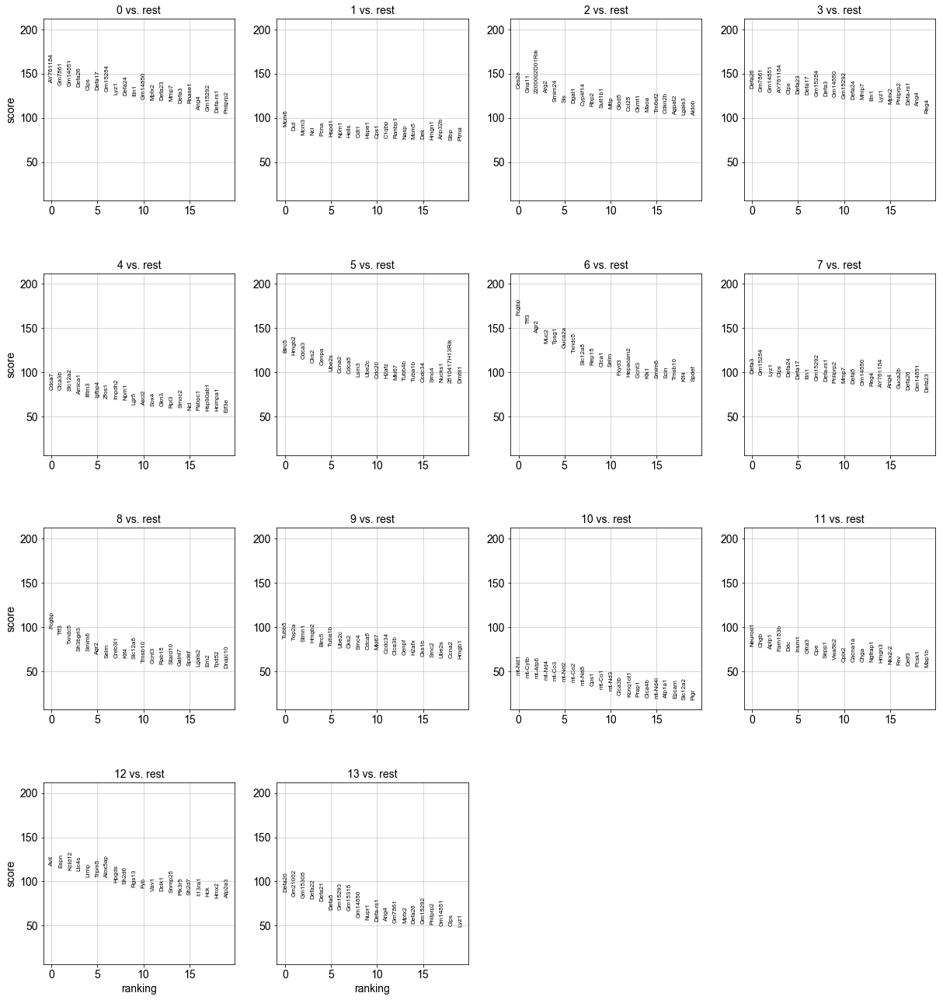

In [23]:
sc.pl.rank_genes_groups(adata_ctrl)

Examining the gene expression of the respective clusters, we identified cell types based on the following gene expression patterns:

* Paneth cells show high expression of *Lyz1*, *Itln1* or *Defa* genes. 

* Enteroendocrine cell cluster are high in *Chga* and *Chgb*. 

* Enterocyte progenitors have a wide range of cell-cycle markers and differentiation markers as *Top2a*, *Birc1* or *Ccnb2*. 

* Intestinal stem cells express *Lgr5* as marker gene. 

* Goblet cells are highes in *Fcgbp*, *Tff3*, or *Spdef*. 

* Enterocytes express *Fabp1* as marker gene. 

* Tuft cells are distinguished by *Dclk1* and *Avil* expression.

In [49]:
genes_to_xls(adata_ctrl, filename='./../table/gut_AB_AL_first_clustering.xls')

Cluster annotation revealed the following cell types:

|Cluster | Cell type|
|--------|----------|
| 0 | Paneth |
| 1 | ISC |
| 2 | Enterocyte |
| 3 | Paneth |
| 4 | ISC |
| 5 | Enterocyte progenitor |
| 6 | Goblet |
| 7 | Paneth |
| 8 | Goblet |
| 9 | ISC |
| 10| Enterocyte progenitor |
| 11| EEC |
| 12| Tuft |
| 13| Paneth |


Create new variable to note cell types:

In [24]:
ECpro_cells = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], ['5', '10']))
ISC = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], ['1','4','9']))
Paneth = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], ['0', '3','7', '13']))
Goblet = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], ['6', '8']))
EC = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], ['2']))
Tuft = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'],['12']))
EEC = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'],['11']))

In [25]:
label_cluster = pd.Series(data=np.concatenate([np.repeat('ISC', len(ISC)),
                                               np.repeat('Enterocyte', len(EC)),
                                               np.repeat('Paneth', len(Paneth)),
                                               np.repeat('Goblet', len(Goblet)),
                                               np.repeat('Tuft', len(Tuft)),
                                               np.repeat('EEC', len(EEC)),
                                               np.repeat('Enterocyte progenitor', 
                                                         len(ECpro_cells)),
                                              
                                              ]), 
                              index=np.concatenate([ISC,EC,Paneth,
                                                    Goblet, Tuft,EEC,ECpro_cells]),
                              dtype='category'
                             ).sort_index()

In [26]:
adata_ctrl.obs['cell_type'] = label_cluster.values


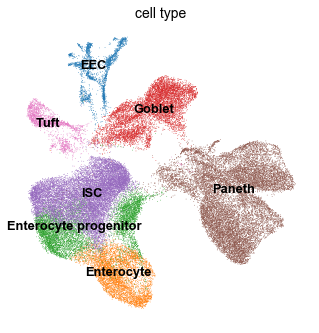

In [27]:
sc.pl.umap(adata_ctrl, color='cell_type', legend_loc='on data', frameon=False)


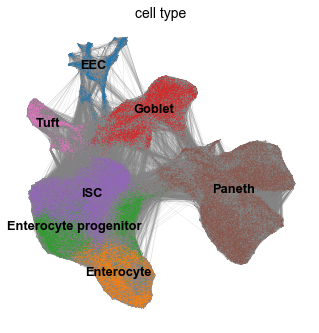

In [28]:
sc.pl.umap(adata_ctrl, color='cell_type', legend_loc='on data', 
           edges=True, frameon=False)


In summary, the coarse grained clustering reveals major cell types, but the borders between some cell types (for example EEC and Goblet cells; ISC and Enterocyte progenitors) are not clear. 

Next, we determine the cell type identity of all cells and identify progenitor populations.

saving figure to file ./../figures/umap210203_sample.pdf


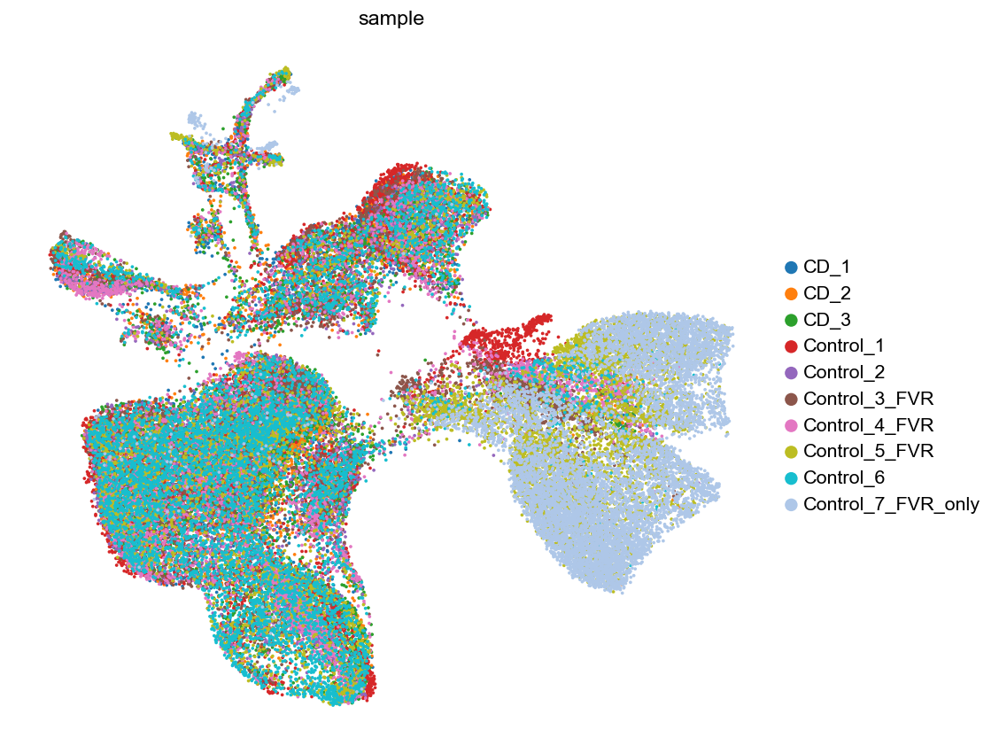

In [71]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(adata_ctrl, color='sample', 
           frameon=False, size=20,
           save=today + '_sample.pdf'
          )


saving figure to file ./../figures/umap210203_cell_cycle.pdf


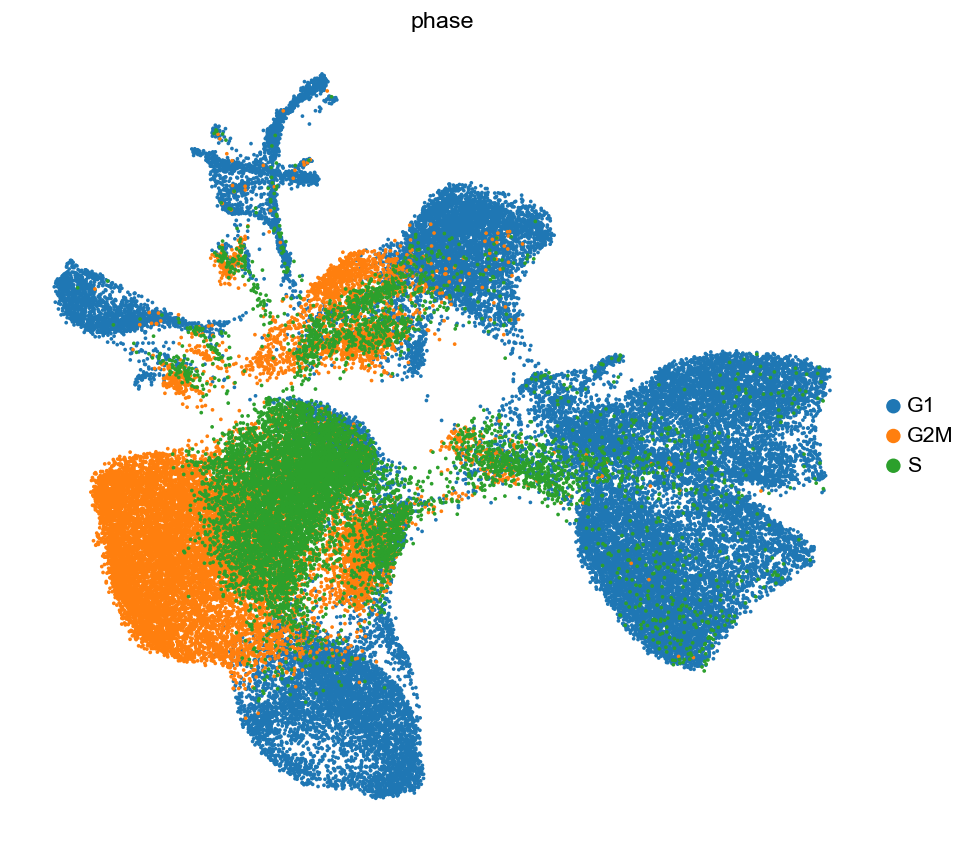

In [91]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(adata_ctrl, color='phase', 
           frameon=False, size=20,
           save=today + '_cell_cycle.pdf'
          )


## Compute density for the different samples

In [181]:
enrichment_dict = {'Foxa2 enriched': ['CD_1', 'CD_2', 'CD_3'],
                   'FVR enriched 90%': 'Control_7_FVR_only',
                   'FVR enriched 50%': 'Control_5_FVR',
                   'whole crypt': 'Control_6'
                  }

Foxa2 enriched


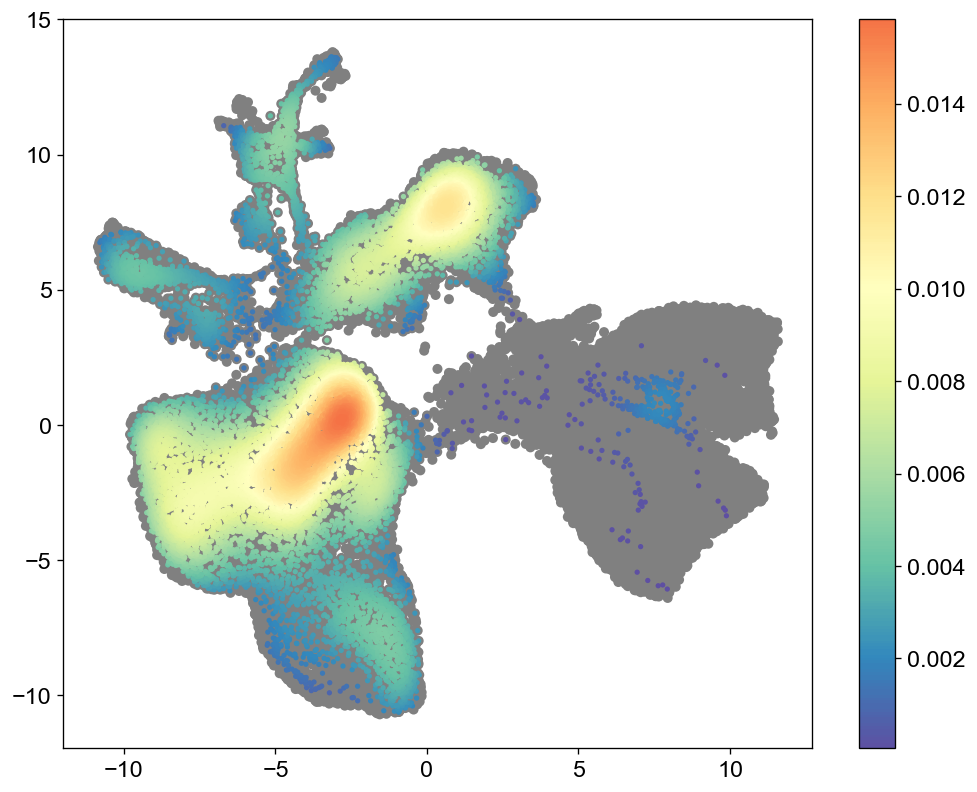

FVR enriched 90%


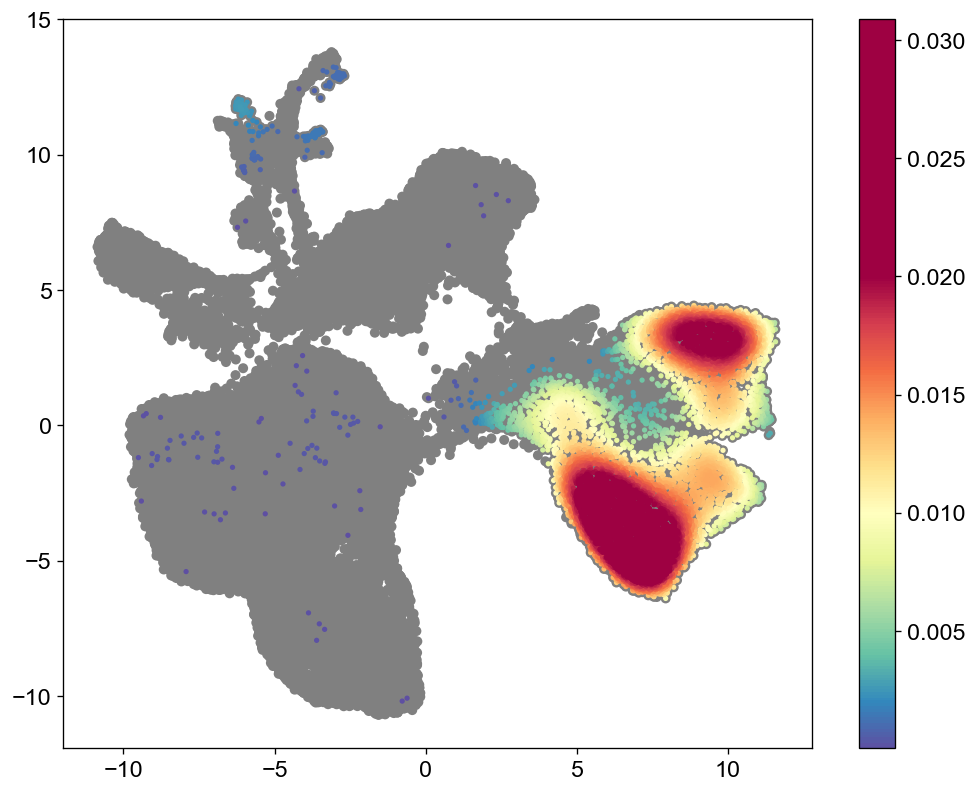

FVR enriched 50%


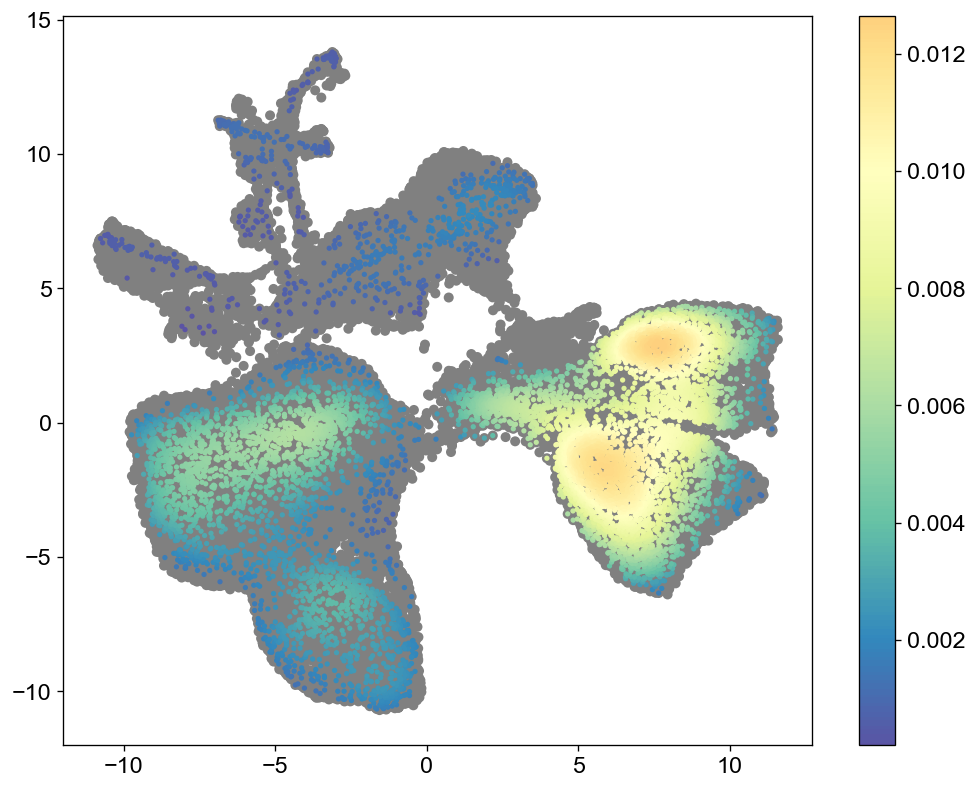

whole crypt


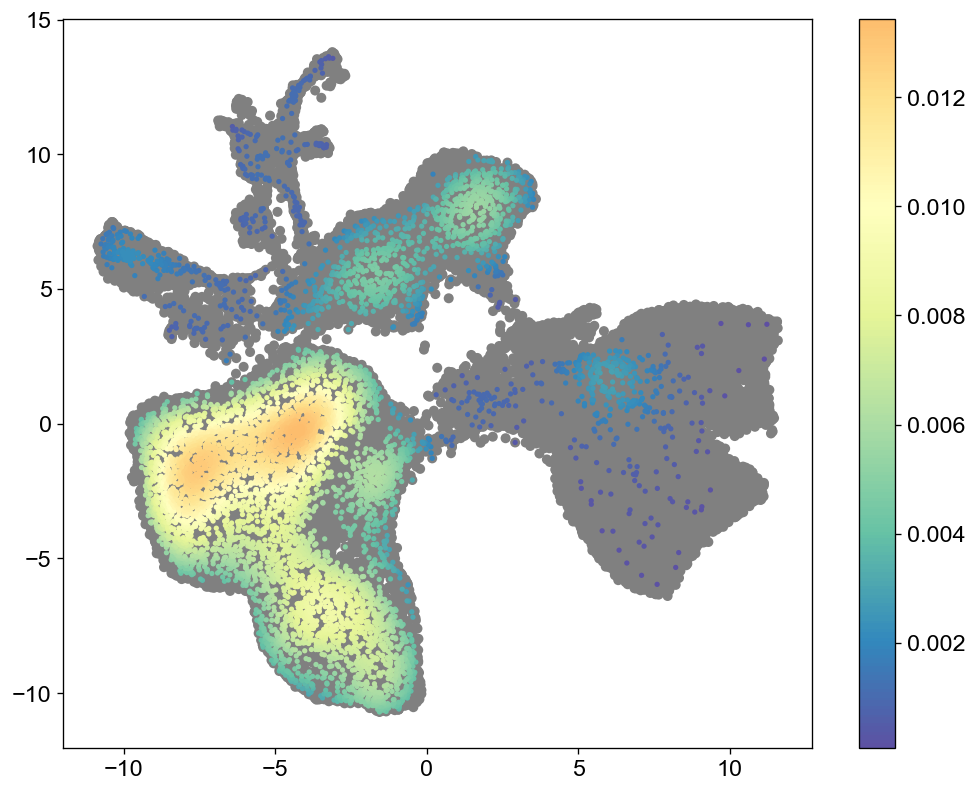

In [185]:
rcParams['figure.figsize']=(10,8)
for enrich in enrichment_dict.keys():
    print(enrich)
    control_samples = np.in1d(adata_ctrl.obs['sample'], 
                              enrichment_dict[enrich])
    adata_control = adata_ctrl[control_samples,:]
    adata_control.obsm['X_umap'] = adata_ctrl.obsm['X_umap'][control_samples,:]
    adata_control= cal_density(adata_control, mapping='X_umap')
    plot_density(adata_control,adata_ctrl, mapping='X_umap', max_scale=0.02, 
                 save= './../figures/density_' +today+'_' + enrich + '.pdf')

## Score gene sets for every cell type

Let us create a score for each cell type based on known marker genes.

|cell type | genes |
|----------|-------|
|ISC | Lgr5, Ascl2, Olfm4, Prom1, Axin2, Fzd2, Fzd7, Lrp5, Lrp6, Notch1, Hes1, Smo, Yap1|
|EEC | Gfi1, Neurog3, Neurod1, Chga, Chgb, Isl1, Arx, Pax6, Foxa2, Sst, Gck, Gcg, Tph1, Pyy|
|Enterocytes| Elf3, Sis, Fabp1|
|Paneth cells| Lyz1, Mmp7, Dll4|
|Goblet cells| Muc2, Spdef, Foxa1|
|Tuft cells| Dclk1, Ptprc, Avil|

In [29]:
genes_ISC = ['Lgr5', 'Ascl2', 'Olfm4', 'Prom1', 'Axin2', 'Fzd2', 
             'Fzd7', 'Lrp5', 'Lrp6', 'Notch1', 'Hes1', 'Smo', 'Yap1']
genes_EEC = ['Gfi1', 'Neurog3', 'Neurod1', 'Chga', 'Chgb', 
             'Isl1', 'Arx', 'Pax6', 'Foxa2', 'Sst', 'Gck', 
             'Gcg', 'Tph1', 'Pyy']
genes_entero = ['Elf3', 'Sis', 'Fabp1']
genes_paneth = ['Lyz1', 'Mmp7', 'Dll4']
genes_goblet = ['Muc2', 'Spdef', 'Foxa1']
genes_tuft = ['Dclk1', 'Ptprc', 'Avil']

In [30]:
sc.tl.score_genes(adata_ctrl, gene_list=genes_ISC,score_name='ISC_score')
sc.tl.score_genes(adata_ctrl, gene_list=genes_EEC,score_name='EEC_score')
sc.tl.score_genes(adata_ctrl, gene_list=genes_entero,score_name='Enterocyte_score')
sc.tl.score_genes(adata_ctrl, gene_list=genes_paneth,score_name='PC_score')
sc.tl.score_genes(adata_ctrl, gene_list=genes_goblet,score_name='GC_score')
sc.tl.score_genes(adata_ctrl, gene_list=genes_tuft,score_name='Tuft_score')

computing score 'ISC_score'
    finished (0:00:09.37) --> added
    'ISC_score', score of gene set (adata.obs)
computing score 'EEC_score'
    finished (0:00:14.12) --> added
    'EEC_score', score of gene set (adata.obs)
computing score 'Enterocyte_score'
    finished (0:00:09.87) --> added
    'Enterocyte_score', score of gene set (adata.obs)
computing score 'PC_score'
    finished (0:00:11.21) --> added
    'PC_score', score of gene set (adata.obs)
computing score 'GC_score'
    finished (0:00:09.65) --> added
    'GC_score', score of gene set (adata.obs)
computing score 'Tuft_score'
    finished (0:00:11.73) --> added
    'Tuft_score', score of gene set (adata.obs)


Negative scores are set to 0.

In [32]:
adata_ctrl.obs['ISC_score'][adata_ctrl.obs['ISC_score']<0] = 0
adata_ctrl.obs['Enterocyte_score'][adata_ctrl.obs['Enterocyte_score']<0] = 0
adata_ctrl.obs['EEC_score'][adata_ctrl.obs['EEC_score']<0] = 0
adata_ctrl.obs['PC_score'][adata_ctrl.obs['PC_score']<0] = 0
adata_ctrl.obs['GC_score'][adata_ctrl.obs['GC_score']<0] = 0
adata_ctrl.obs['Tuft_score'][adata_ctrl.obs['Tuft_score']<0] = 0

/Users/Maren.Buettner/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/Maren.Buettner/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/Maren.Buettner/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package s

saving figure to file ./../figures/umap210203_cell_type_score1.pdf


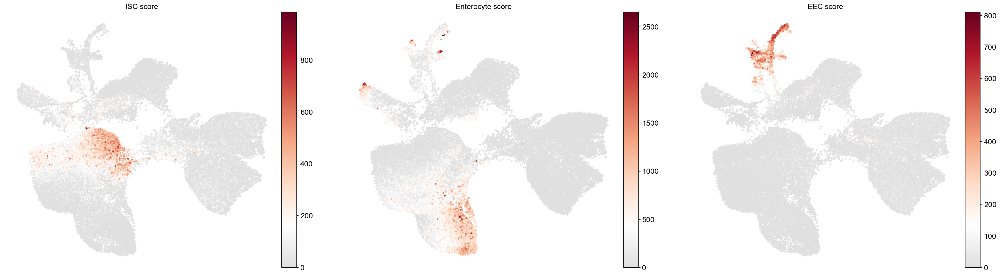

saving figure to file ./../figures/umap210203_cell_type_score2.pdf


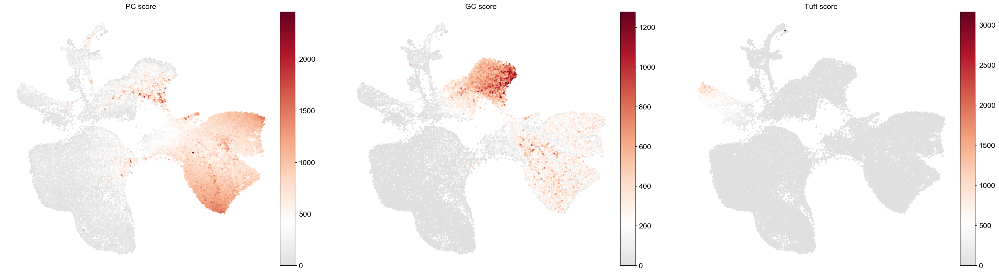

In [69]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(adata_ctrl, frameon=False,
           color=['ISC_score', 'Enterocyte_score', 'EEC_score'], 
           color_map=mymap, size=40, save= today+'_cell_type_score1.pdf')
sc.pl.umap(adata_ctrl, frameon=False,
           color=['PC_score', 'GC_score', 'Tuft_score'], 
           color_map=mymap, size=40, save=today+ '_cell_type_score2.pdf')

## Refine cell type annotation for absorptive lineage

We start to refine the cell type annotation with the ISCs and the enterocyte lineage.

### Resolve ISC and Enterocyte clusters

Select ISC, enterocyte and enterocyte progenitors.

In [33]:
a_ITE_idx = np.in1d(adata_ctrl.obs['cell_type'], 
                    ['Enterocyte progenitor', 'Enterocyte', 'ISC'])
a_ITE = adata_ctrl[a_ITE_idx,:]

In [34]:
a_ITE

View of AnnData object with n_obs × n_vars = 27122 × 2000 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'S_score', 'G2M_score', 'phase', 'louvain', 'cell_type', 'ISC_score', 'EEC_score', 'Enterocyte_score', 'PC_score', 'GC_score', 'Tuft_score'
    var: 'mean', 'dispersion'
    uns: 'neighbors', 'pca', 'sample_colors', 'phase_colors', 'louvain', 'louvain_colors', 'rank_genes_groups', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [35]:
sc.tl.pca(a_ITE, svd_solver='arpack')
sc.pp.neighbors(a_ITE, n_neighbors=30)
sc.tl.umap(a_ITE, min_dist=0.09)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:18.66) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:32.79) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [36]:
sc.tl.louvain(a_ITE, resolution=3)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:03.10) --> found 24 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


    number of colors in `.uns[louvain'_colors']` smaller than number of categories, falling back to palette


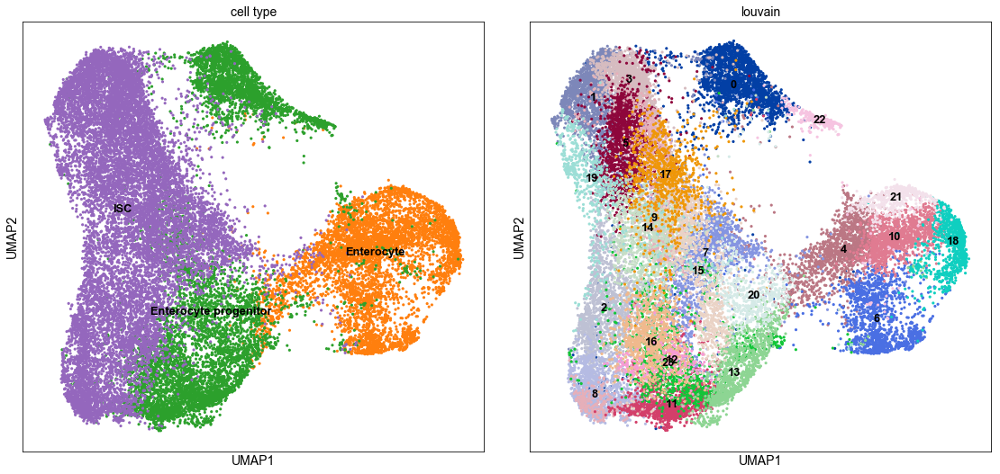

In [37]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(a_ITE, color=['cell_type', 'louvain'], 
           size=40, legend_loc='on data')

Subcluster cluster 0.

In [95]:
sc.tl.louvain(a_ITE,resolution=1.5, restrict_to=['louvain', ['0']])

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.22) --> found 9 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical)


    number of colors in `.uns[louvain_R'_colors']` smaller than number of categories, falling back to palette


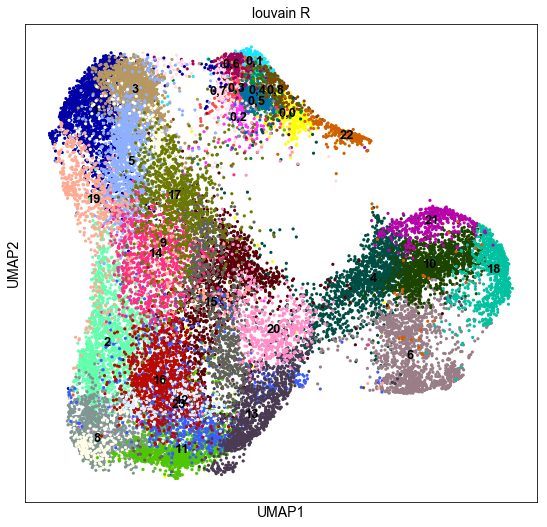

In [96]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(a_ITE, color=['louvain_R'], 
           size=40, legend_loc='on data')

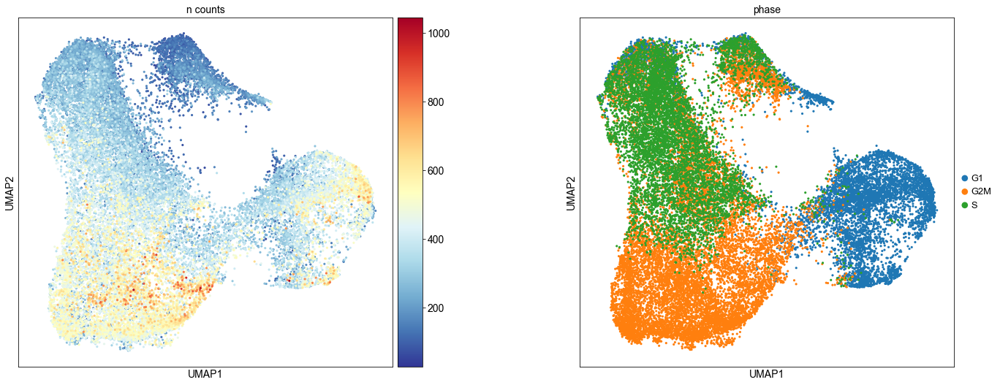

In [38]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(a_ITE, color=['n_counts', 'phase'], 
           size=40)

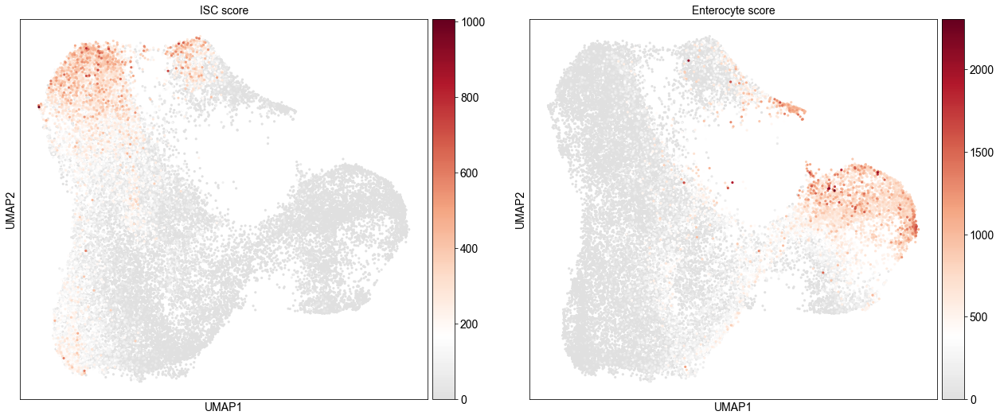

In [39]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(a_ITE, color=['ISC_score', 'Enterocyte_score'], size=40, color_map=mymap)

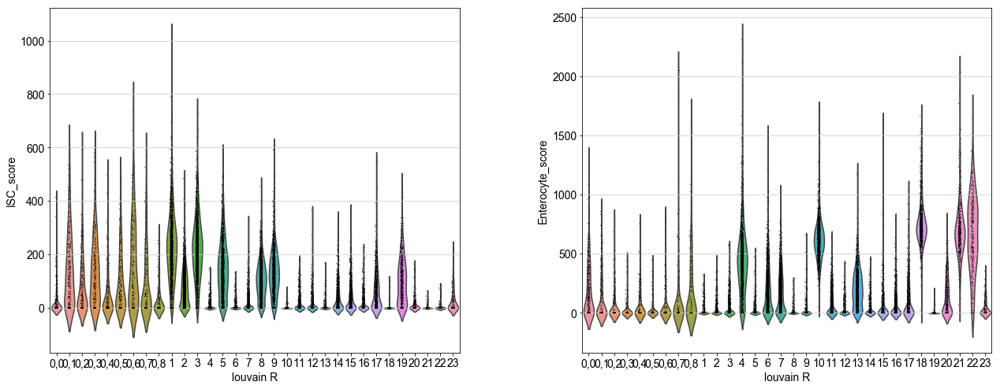

In [97]:
sc.pl.violin(a_ITE, groupby='louvain_R', keys=['ISC_score', 'Enterocyte_score'])

In [98]:
sc.tl.rank_genes_groups(a_ITE, groupby='louvain_R',only_positive=True)

ranking genes
    finished (0:02:09.51) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


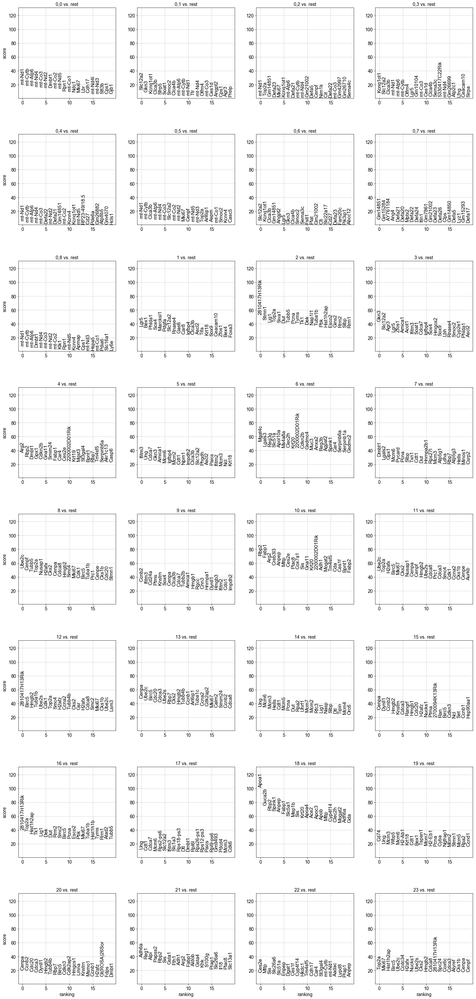

In [99]:
rcParams['figure.figsize']=(6,6)
sc.pl.rank_genes_groups(a_ITE, fontsize=15)

Based on the known marker genes, we assign cell type labels for all groups.

Overview:
* ISC:  `1`, `2`,`3`,`5`, `8`,`9`,`17`, `19`, `0,1`,`0,3`, `0,6`, `0,7` 
* Enterocyte progenitor: `0,0`, `0,2`,`0,4`,`0,5`, `0,8`, `7`,`11`,`12`,`13`,`14`,`15`,`16`,`20`,`23`
* Enterocyte:  `4`, `6`, `10`, `18`, `21`, `22`

In [100]:
a_ITE.obs['cell_type'][np.in1d(a_ITE.obs['louvain_R'], 
                               ['1', '2', '3', '5', '8', '9',
                                '19', '0,1', '0,3', '0,6', '0,7'])] = np.repeat(
    'ISC', np.in1d(a_ITE.obs['louvain_R'],
                   ['1', '2', '3', '5', '8', '9',
                     '19', '0,1', '0,3', '0,6', '0,7']).sum())
a_ITE.obs['cell_type'][np.in1d(a_ITE.obs['louvain_R'], 
                               ['0,0','0,2','0,4','0,5', '0,8', 
                                '7','11','12',
                                '13','14','15','16','17','20','23'
                               ])] = np.repeat(
    'Enterocyte progenitor', np.in1d(a_ITE.obs['louvain_R'], 
                                     ['0,0','0,2','0,4','0,5', '0,8', 
                                      '7','11','12',
                                '13','14','15','16','17','20','23']).sum())
a_ITE.obs['cell_type'][np.in1d(a_ITE.obs['louvain_R'], 
                               ['4', '6', '10', '18', '21', '22'])] = np.repeat(
    'Enterocyte', np.in1d(a_ITE.obs['louvain_R'], 
                          ['4', '6', '10', '18', '21', '22']).sum())
a_ITE.obs['cell_type']=a_ITE.obs['cell_type'].cat.remove_unused_categories()

In [101]:
a_ITE.obs['cell_type'].value_counts()

Enterocyte progenitor    10705
ISC                      10560
Enterocyte                5857
Name: cell_type, dtype: int64

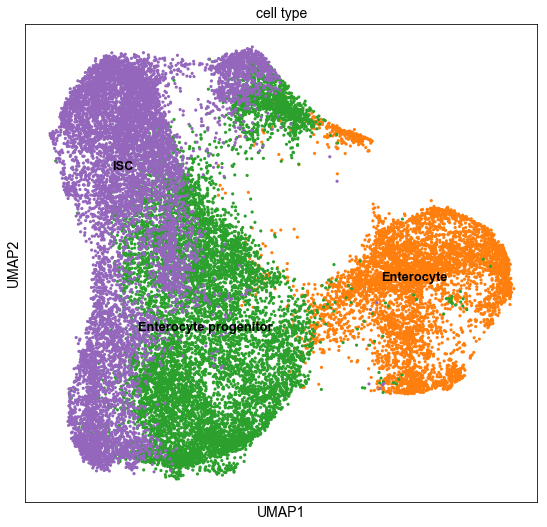

In [102]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(a_ITE, color=['cell_type'], 
           size=40, legend_loc='on data')

Save annotation to file.

In [103]:
a_ITE.obs['cell_type'].to_csv('./../table/ISC_ECpro_EC_final_clustering.csv')

### Resolve ISC clusters

In the previous section, we have investigated the characterization into *intestinal stem cells* (ISC), *enterocyte progenitors* and *enterocytes*. 

Next, we aim to subcluster ISCs further.

In [104]:
a_ISC_idx = np.in1d(a_ITE.obs['cell_type'], ['ISC'])
a_ISC = a_ITE[a_ISC_idx,:]

In [105]:
sc.tl.pca(a_ISC, svd_solver='arpack')

In [106]:
sc.pp.neighbors(a_ISC, n_neighbors=30)
sc.tl.umap(a_ISC)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:07.45) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:11.12) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [107]:
sc.tl.louvain(a_ISC, resolution=1)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:01.10) --> found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


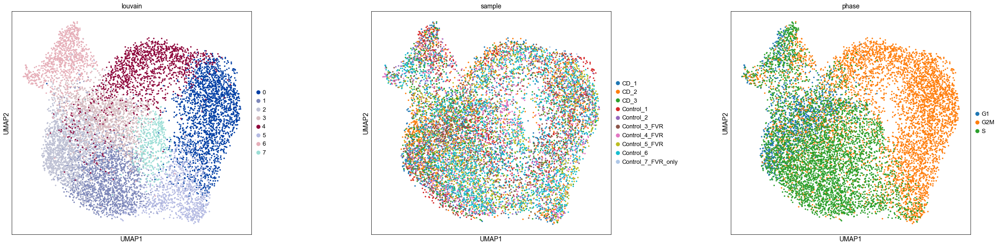

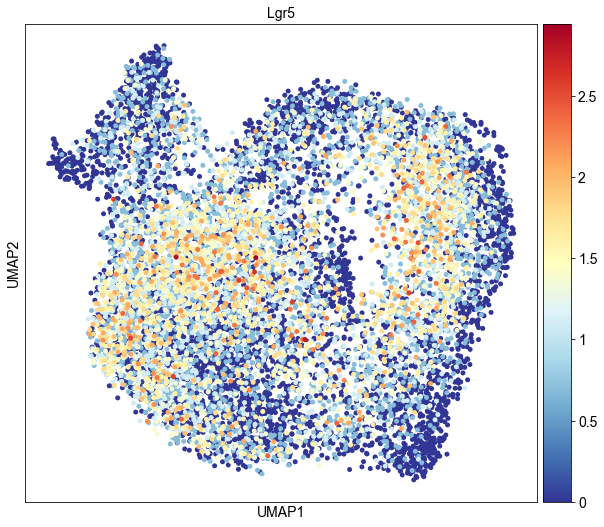

In [108]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(a_ISC, color=['louvain', 'sample', 'phase'], size=40)
sc.pl.umap(a_ISC, color=['Lgr5'], size=100)

Subcluster cluster 2, 3 and 6. 

In [122]:
sc.tl.louvain(a_ISC,resolution=1.5, restrict_to=['louvain', ['2','3', '6']])

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.37) --> found 9 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical)


    number of colors in `.uns[louvain_R'_colors']` smaller than number of categories, falling back to palette


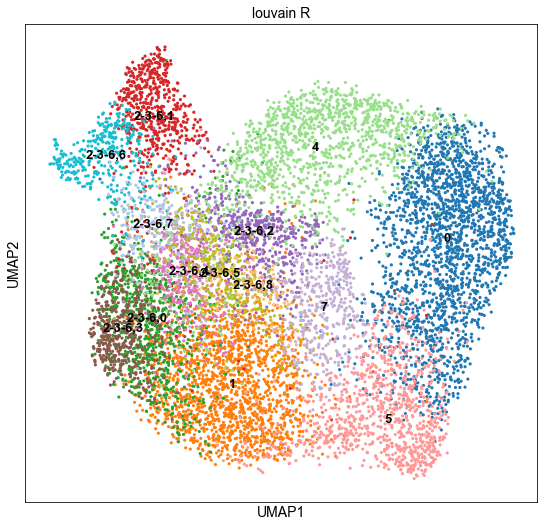

In [123]:
rcParams['figure.figsize']=(8,8)

sc.pl.umap(a_ISC, color=['louvain_R'], size=40, legend_loc='on data')


In [124]:
sc.tl.rank_genes_groups(a_ISC, groupby='louvain_R')

ranking genes
    finished (0:00:20.68) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


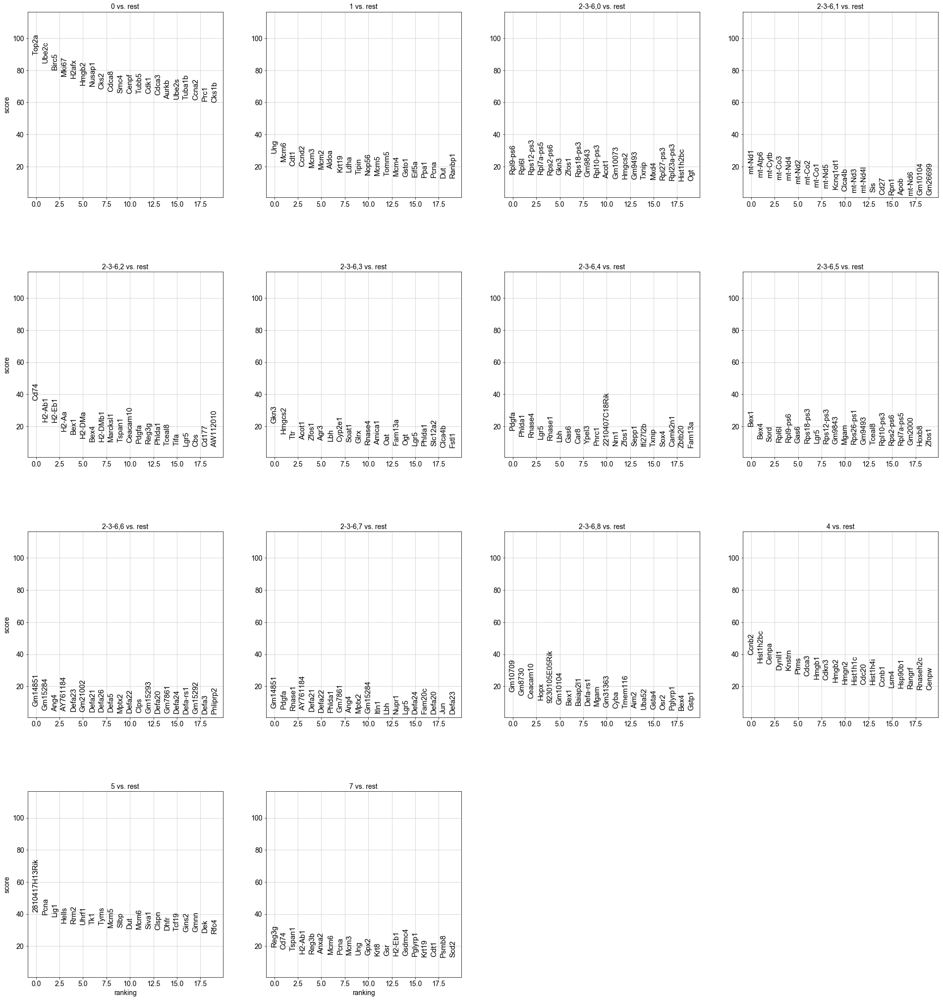

In [125]:
sc.pl.rank_genes_groups(a_ISC, fontsize=15)

#### Summary

The ISCs show some heterogeneity for example with respect to *Reg3g*, but apparently most substructure is due to cell cycle. Some subclusters of number 2, 3 and 6 show Paneth cell identity (expression of defensins and Lyz1). In the following, we will check how the subcluster embed in the coarse-grained clustering to find a 'Paneth primed ISC'.

#### Merge ISC subtypes with control dataset 

We aim to find out the relation of the ISC subtypes with the other cell populations to derive a primed cell state. 

In [126]:
adata_ctrl.obs['refined_clustering'] = pd.concat(
    [a_ITE.obs['cell_type'][np.invert(np.in1d(a_ITE.obs['cell_type'], ['ISC']))], 
     a_ISC.obs['louvain_R'], 
     adata_ctrl.obs['cell_type'][np.invert(np.in1d(adata_ctrl.obs['cell_type'],
                                ['ISC', 'Enterocyte','Enterocyte progenitor']))]])

In [127]:
adata_ctrl.obs['refined_clustering'].value_counts()

Paneth                   16796
Enterocyte progenitor    10705
Goblet                    7848
Enterocyte                5857
EEC                       2383
Tuft                      2143
0                         2072
1                         1757
4                         1325
5                          966
2-3-6,0                    851
2-3-6,1                    615
2-3-6,2                    573
2-3-6,3                    483
7                          419
2-3-6,4                    415
2-3-6,5                    392
2-3-6,6                    355
2-3-6,7                    207
2-3-6,8                    130
Name: refined_clustering, dtype: int64

We use graph abstraction (PAGA) to identify the cell type relations.

In [128]:
sc.tl.paga(adata_ctrl, groups='refined_clustering')

... storing 'refined_clustering' as categorical
running partition-based graph abstraction (PAGA)
    finished (0:00:06.23) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)


    number of colors in `.uns[refined_clustering'_colors']` smaller than number of categories, falling back to palette
--> added 'pos', the PAGA positions (adata.uns['paga'])


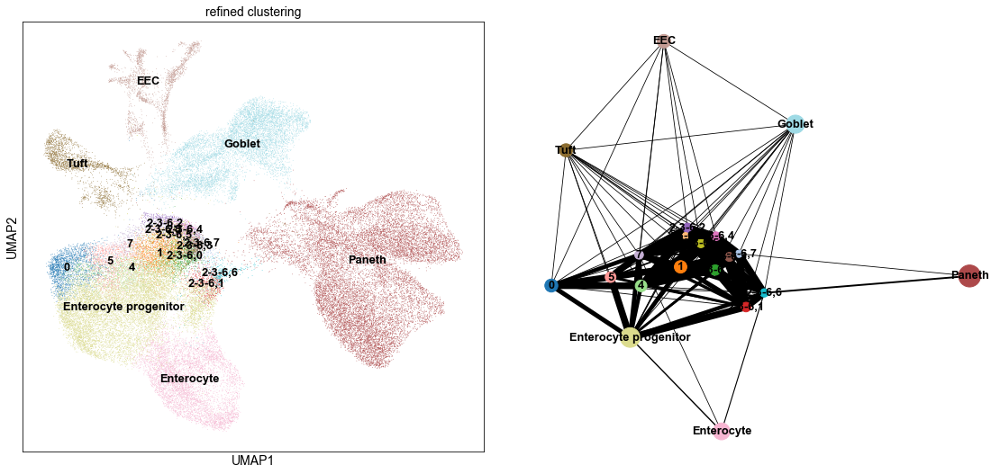

In [129]:
sc.pl.paga_compare(adata_ctrl, basis='umap', 
                   edge_width_scale=1,min_edge_width=0.8, threshold=0.015)

--> added 'pos', the PAGA positions (adata.uns['paga'])


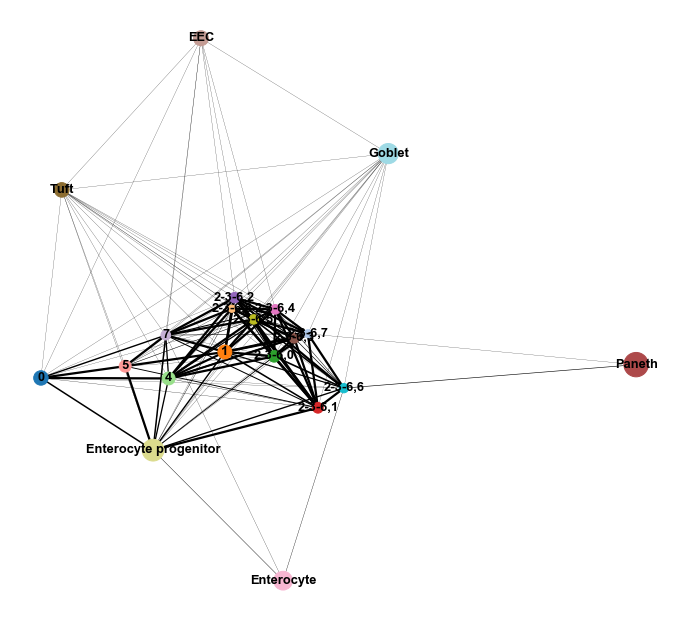

In [130]:
rcParams['figure.figsize']=(10,10)
sc.pl.paga(adata_ctrl, edge_width_scale=0.3,
           min_edge_width=0.2, threshold=0.015, frameon=False,
          pos=adata_ctrl.uns['paga']['pos'],
          )

Clusters `2-3-6,1`,`2-3-6,4`, `2-3-6,6`, `2-3-6,7`, `2-3-6,8` directly connect to Paneth cells, and express Paneth cell markers. We merge them as `Paneth primed ISCs`. 

#### Merge ISC subgroups

In [135]:
a_ISC.obs['ISC_group_final']=a_ISC.obs['louvain_R']
a_ISC.obs['ISC_group_final']= a_ISC.obs['ISC_group_final'].cat.add_categories(
    ['ISC', 'Paneth primed ISC'])

a_ISC.obs['ISC_group_final'][np.in1d(a_ISC.obs['louvain_R'], 
                                     ['0', '1','4','5','7', 
                                      '2-3-6,0','2-3-6,2', 
                                      '2-3-6,3', '2-3-6,5'])] = np.repeat(
    'ISC', np.in1d(a_ISC.obs['louvain_R'], ['0', '1','4','5','7', 
                                      '2-3-6,0','2-3-6,2', 
                                      '2-3-6,3', '2-3-6,5']).sum())
a_ISC.obs['ISC_group_final'][np.in1d(a_ISC.obs['louvain_R'], 
                        ['2-3-6,1', '2-3-6,4', 
                         '2-3-6,6', '2-3-6,7', '2-3-6,8'])] = np.repeat(
    'Paneth primed ISC', np.in1d(a_ISC.obs['louvain_R'], 
                                 ['2-3-6,1', '2-3-6,4', 
                                  '2-3-6,6', '2-3-6,7','2-3-6,8']).sum())

a_ISC.obs['ISC_group_final']=a_ISC.obs['ISC_group_final'].cat.remove_unused_categories()

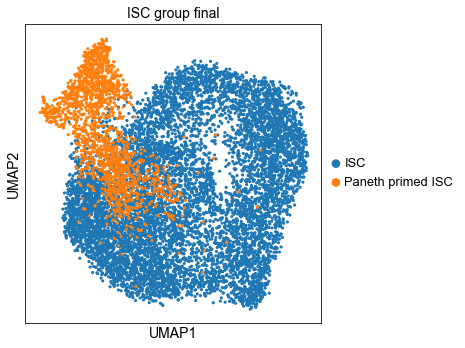

In [136]:
rcParams['figure.figsize']=(5,5)
sc.pl.umap(a_ISC, color=['ISC_group_final'], size=40)


Show number of cells per cell population and per sample.

In [137]:
a_ISC.obs['ISC_group_final'].value_counts()

ISC                  8838
Paneth primed ISC    1722
Name: ISC_group_final, dtype: int64

In [138]:
pd.crosstab( a_ISC.obs['sample'],a_ISC.obs['ISC_group_final'])

ISC_group_final,ISC,Paneth primed ISC
sample,,
CD_1,1087,173
CD_2,1300,202
CD_3,1024,246
Control_1,466,222
Control_2,566,143
Control_3_FVR,917,296
Control_4_FVR,800,119
Control_5_FVR,970,101
Control_6,1659,218


Compare both ISC subgroups.

In [141]:
sc.tl.rank_genes_groups(a_ISC, groupby='ISC_group_final', only_positive=True)

ranking genes
    finished (0:00:02.35) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


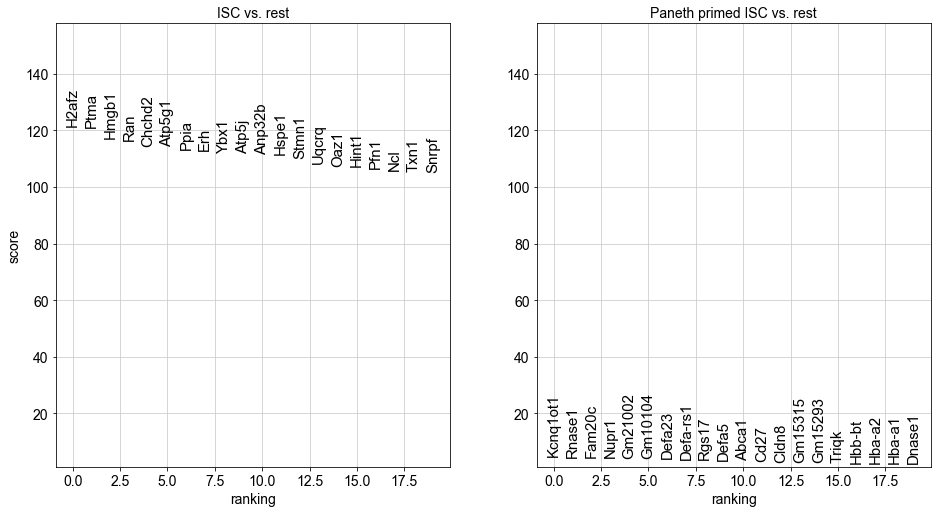

In [142]:
rcParams['figure.figsize']=(8,8)
sc.pl.rank_genes_groups(a_ISC, fontsize=15)

In [143]:
genes_to_xls(adata=a_ISC, filename='./../table/ISC_final.xls')

Write final clustering to file.

In [144]:
a_ISC.obs['ISC_group_final'].to_csv('./../data/ISC_refined_clustering_new.csv')

Save finalised ISC clustering to control data.

In [145]:
adata_ctrl.obs['refined_clustering'] = pd.concat(
    [a_ITE.obs['cell_type'][np.invert(np.in1d(a_ITE.obs['cell_type'], ['ISC']))], 
     a_ISC.obs['ISC_group_final'], 
     adata_ctrl.obs['cell_type'][np.invert(np.in1d(adata_ctrl.obs['cell_type'],
                                ['ISC', 'Enterocyte','Enterocyte progenitor']))]])

In [146]:
adata_ctrl.obs['refined_clustering'].value_counts()

Paneth                   16796
Enterocyte progenitor    10705
ISC                       8838
Goblet                    7848
Enterocyte                5857
EEC                       2383
Tuft                      2143
Paneth primed ISC         1722
Name: refined_clustering, dtype: int64

# Save control samples to file

In [147]:
adata_ctrl.write('./../data/gut_AB_AL_log_cor_control.h5ad')

In the next notebook, we refine Goblet, Paneth and Tuft cells, while the subtype annotation of EECs fills a separate notebook.